**Travel Planner Agent**

AI travel planners are powerful tools for efficiency, personalization, and 24/7 support, handling logistics and data analysis faster than humans, but humans are still essential for complex, unique, or emotionally sensitive trips, providing the "magic," creativity, empathy, and on-the-ground problem-solving that AI lacks, making the future a human-AI partnership (A+A model) for truly memorable travel.

**Why AI is Great for Travel Planning:**

• **Speed & Efficiency**: Scans countless options (flights, hotels) instantly, saving hours of research.

• **Hyper-Personalization**: Analyzes preferences, past trips, and social cues to create tailored itineraries.

• **24/7 Availability**: Offers support and handles changes anytime, day or night.

• **Cost Savings**: Finds the best deals in real-time.

• **Logistics Management**: Handles bookings, compares options, and manages preferences seamlessly.

• **Proactive Support**: Monitors delays/cancellations and suggests solutions automatically.


**Key Components**:


*   **StateGraph**: The core of our application, defining the flow of our Travel Planner.
*   **PlannerState**: A custom type representing the state of our planning process.
*   **Node Functions**: Individual steps in our planning process (input_city, input_interests, create_itinerary).
*   **LLM Integration**: Utilizing a language model to generate the final itinerary.

**Method Details**: Our Travel Planner follows a straightforward, three-step process:

*   **City Input**: The application prompts the user to enter the city they want to visit. This information is stored in the state.
*   Interests Input: The user is asked to provide their interests for the trip.These interests are stored as a list in the state.
*   Itinerary Creation: Using the collected city and interests, the application leverages a language model to generate a personalized day trip itinerary.

The generated itinerary is presented to the user.
The flow between these steps is managed by LangGraph, which handles the state transitions and ensures that each step is executed in the correct order.

**Installation And Importing Of Libraries**

In [ ]:
!pip -qq install -U langchain langchain-community langgraph pydantic google-ai-generativelanguage==0.6.15 langchain-google-genai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 52.4 MB/s eta 0:00:00


In [ ]:
!pip install "pydantic>=2.8,<3.0"
!pip install "langchain-core>=0.3.10"
!pip install "langgraph>=1.0.0"
!pip install "langchain-google-genai>=2.0.0"
!pip install "google-genai>=1.50.0"

In [ ]:
pip install serpapi python-dotenv SpeechRecognition pydub gTTS playsound


In [ ]:
pip install --upgrade langchain langchain-google-genai langgraph

  Using cached langchain-1.1.2-py3-none-any.whl.metadata (4.9 kB)
  Using cached langchain_google_genai-3.2.0-py3-none-any.whl.metadata (2.7 kB)
  Using cached langgraph-1.0.4-py3-none-any.whl.metadata (7.8 kB)
  Using cached langchain_core-1.1.1-py3-none-any.whl.metadata (3.7 kB)
  Using cached google_ai_generativelanguage-0.9.0-py3-none-any.whl.metadata (10 kB)
  Using cached langgraph_prebuilt-1.0.5-py3-none-any.whl.metadata (5.2 kB)
Using cached langchain-1.1.2-py3-none-any.whl (102 kB)
Using cached langchain_google_genai-3.2.0-py3-none-any.whl (57 kB)
Using cached langgraph-1.0.4-py3-none-any.whl (157 kB)
Using cached google_ai_generativelanguage-0.9.0-py3-none-any.whl (1.4 MB)
Using cached langchain_core-1.1.1-py3-none-any.whl (475 kB)
Using cached langgraph_prebuilt-1.0.5-py3-none-any.whl (35 kB)


In [ ]:
import os
import urllib.parse
from typing import TypedDict, Annotated, List, Optional, Dict, Any
from langgraph.graph import StateGraph, END
from langchain_core.messages import HumanMessage, AIMessage
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.runnables.graph import MermaidDrawMethod
from IPython.display import display, Image
from dotenv import load_dotenv

# Tools (your provided code, slightly adapted to be callable directly)
import serpapi
from pydantic import BaseModel, Field
from langchain_core.tools import tool
from langchain_google_genai import ChatGoogleGenerativeAI
from getpass import getpass

# Use the key
os.environ['GOOGLE_API_KEY'] = getpass('Enter your Google API key: ')
os.environ["SERPAPI_API_KEY"] = getpass("Enter your SERPAPI_API_KEY")

Enter your Google API key: ··········
Enter your SERPAPI_API_KEY··········


**Define Agent Tools**

In [ ]:
class FlightsInput(BaseModel):
    departure_airport: str = Field(description="Departure airport code (IATA)")
    arrival_airport: str = Field(description="Arrival airport code (IATA)")
    outbound_date: str = Field(description="YYYY-MM-DD")
    return_date: Optional[str] = Field(None, description="YYYY-MM-DD")
    adults: Optional[int] = 1
    children: Optional[int] = 0
    infants_in_seat: Optional[int] = 0
    infants_on_lap: Optional[int] = 0


@tool(args_schema=FlightsInput)
def flights_finder(
    departure_airport: str,
    arrival_airport: str,
    outbound_date: str,
    return_date: Optional[str] = None,
    adults: int = 1,
    children: int = 0,
    infants_in_seat: int = 0,
    infants_on_lap: int = 0,
):
    """Search for flights using SerpAPI Google Flights engine."""

    params_dict = {
        "api_key": os.environ.get("SERPAPI_API_KEY"),
        "engine": "google_flights",
        "hl": "en",
        "gl": "us",
        "departure_id": departure_airport,
        "arrival_id": arrival_airport,
        "outbound_date": outbound_date,
        "return_date": return_date,
        "currency": "USD",
        "adults": adults,
        "children": children,
        "infants_in_seat": infants_in_seat,
        "infants_on_lap": infants_on_lap,
        "stops": 1,
    }

    try:
        search = serpapi.search(params_dict)
        return search.data.get("best_flights", [])
    except Exception as e:
        return {"error": str(e)}


In [ ]:
class HotelsInput(BaseModel):
    q: str = Field(description="Location of the hotel")
    check_in_date: str = Field(description="Check-in date YYYY-MM-DD")
    check_out_date: str = Field(description="Check-out date YYYY-MM-DD")
    sort_by: Optional[str] = "8"
    adults: Optional[int] = 1
    children: Optional[int] = 0
    rooms: Optional[int] = 1
    hotel_class: Optional[str] = None


@tool(args_schema=HotelsInput)
def hotels_finder(
    q: str,
    check_in_date: str,
    check_out_date: str,
    sort_by: Optional[str] = "8",
    adults: int = 1,
    children: int = 0,
    rooms: int = 1,
    hotel_class: Optional[str] = None,
):
    """Search hotels using SerpAPI Google Hotels engine."""

    params_dict = {
        "api_key": os.environ.get("SERPAPI_API_KEY"),
        "engine": "google_hotels",
        "hl": "en",
        "gl": "us",
        "q": q,
        "check_in_date": check_in_date,
        "check_out_date": check_out_date,
        "currency": "USD",
        "adults": adults,
        "children": children,
        "rooms": rooms,
        "sort_by": sort_by,
        "hotel_class": hotel_class,
    }

    try:
        search = serpapi.search(params_dict)
        data = search.data or {}
        return data.get("properties", [])[:5]
    except Exception as e:
        return {"error": str(e)}


In [ ]:
class CarsInput(BaseModel):
    pickup_location: str = Field(description="Pickup location city or airport")
    dropoff_location: Optional[str] = Field(
        default=None, description="Dropoff location (optional; default same as pickup)"
    )
    pickup_date: str = Field(description="Pickup date YYYY-MM-DD")
    dropoff_date: str = Field(description="Dropoff date YYYY-MM-DD")
    pickup_time: Optional[str] = Field(default="10:00", description="HH:MM")
    dropoff_time: Optional[str] = Field(default="10:00", description="HH:MM")
    car_class: Optional[str] = Field(default=None, description="Economy, SUV, etc.")


@tool(args_schema=CarsInput)
def cars_finder(
    pickup_location: str,
    pickup_date: str,
    dropoff_date: str,
    dropoff_location: Optional[str] = None,
    pickup_time: str = "10:00",
    dropoff_time: str = "10:00",
    car_class: Optional[str] = None,
):
    """Search rental cars using SerpAPI Google Cars engine."""

    if dropoff_location is None:
        dropoff_location = pickup_location  # Same-city rentals default

    params = {
        "api_key": os.environ.get("SERPAPI_API_KEY"),
        "engine": "google",
        "q": f"car rentals {pickup_location}",
        "pickup_date": pickup_date,
        "dropoff_date": dropoff_date,
        "pickup_time": pickup_time,
        "dropoff_time": dropoff_time,
        "car_class": car_class,
    }

    try:
        search = serpapi.search(params)
        data = search.data or {}
        return data.get("car_listings", [])[:5]
    except Exception as e:
        return {"error": str(e)}


In [ ]:
class RestaurantsInput(BaseModel):
    location: str = Field(description="City or area name")
    query: str = Field(
        default="restaurants",
        description="Search term: restaurants, cafes, coffee shops, food places"
    )
    max_results: int = Field(default=5, description="Number of results to return")


@tool(args_schema=RestaurantsInput)
def restaurants_finder(location: str, query: str = "restaurants", max_results: int = 5):
    """Search restaurants or coffee shops using SerpAPI Google Local engine."""

    params = {
        "api_key": os.environ.get("SERPAPI_API_KEY"),
        "engine": "google_local",
        "q": f"{query} in {location}",
        "hl": "en",
        "gl": "us",
    }

    try:
        search = serpapi.search(params)
        data = search.data or {}
        return data.get("local_results", [])[:max_results]
    except Exception as e:
        return {"error": str(e)}


**Define Agent State**

In [ ]:
class PlannerState(TypedDict):
    messages: Annotated[List[HumanMessage | AIMessage], "The messages in the conversation"]
    city: str
    interests: List[str]
    itinerary: str
    input_mode: str
    output_mode: str
    language: str

    # Flights
    departure_airport: Optional[str]
    arrival_airport: Optional[str]
    outbound_date: Optional[str]
    return_date: Optional[str]
    want_flights: bool
    flight_options: List[Dict[str, Any]]
    chosen_flight: Optional[Dict[str, Any]]

    # Hotels
    want_hotels: bool
    hotel_check_in: Optional[str]
    hotel_check_out: Optional[str]
    hotel_options: List[Dict[str, Any]]
    chosen_hotel: Optional[Dict[str, Any]]

    # Cars
    want_cars: bool
    pickup_location: Optional[str]
    dropoff_location: Optional[str]
    pickup_date: Optional[str]
    dropoff_date: Optional[str]
    pickup_time: Optional[str]
    dropoff_time: Optional[str]
    car_class: Optional[str]
    car_options: List[Dict[str, Any]]
    chosen_car: Optional[Dict[str, Any]]

    # Restaurants
    want_restaurants: bool
    restaurant_query: Optional[str]
    restaurant_results_limit: int
    restaurant_options: List[Dict[str, Any]]
    chosen_restaurant: Optional[Dict[str, Any]]


**Set the Language Model and Prompts**

In [ ]:
llm = ChatGoogleGenerativeAI(model="gemini-2.5-flash")

itinerary_prompt = ChatPromptTemplate.from_messages([
    ("system",
     """
     You are a helpful travel assistant.
     Create a day trip itinerary for {city} based on user's interests: {interests}.
     Provide a brief, bulleted, simple and engaging itinerary.
     """),
    ("human", "Create an itinerary for my day trip.")
])


**Audio I/O functions supporting STT (input transcription) and TTS (output synthesis)**

In [ ]:
def transcribe_audio_file(filepath: str) -> str:
    """
    Simple speech->text helper if user provides an audio file path.
    Requires SpeechRecognition + pydub (and ffmpeg).
    """
    try:
        import speech_recognition as sr
        from pydub import AudioSegment
    except Exception:
        return "[transcription-unavailable: missing libs]"

    recognizer = sr.Recognizer()
    # convert to WAV if needed
    audio = AudioSegment.from_file(filepath)
    wav_path = "/tmp/tmp_audio_for_transcribe.wav"
    audio.export(wav_path, format="wav")
    with sr.AudioFile(wav_path) as source:
        audio_data = recognizer.record(source)
    try:
        text = recognizer.recognize_google(audio_data)
    except Exception:
        text = "[transcription-failed]"
    return text

In [ ]:
def speak_text(text, lang="en"):
    from google.colab import files
    from IPython.display import Audio, display
    import tempfile
    from gtts import gTTS

    # Create TTS file
    tts = gTTS(text=text, lang=lang)
    tmp_path = "/tmp/tts_out.mp3"
    tts.save(tmp_path)

    print(f"[Audio saved at: {tmp_path}]")

    # Auto-play inside Colab
    display(Audio(tmp_path, autoplay=True))

    # Auto-download
    files.download(tmp_path)


**Define Agent Functions**

In [63]:
def choose_input_mode(state: PlannerState) -> PlannerState:
    print("Choose input mode: (1) text (2) audio-file")
    choice = input("Your choice [1/2]: ").strip()
    mode = "text" if choice != "2" else "audio"
    return {
        **state,
        "input_mode": mode,
        "messages": state["messages"] + [HumanMessage(content=f"Input mode: {mode}")]
    }

def choose_output_mode_and_language(state: PlannerState) -> PlannerState:
    print("Choose output mode: (1) text (2) audio")
    out_choice = input("Your choice [1/2]: ").strip()
    out_mode = "text" if out_choice != "2" else "audio"

    print("Choose language code (e.g., en, hi, es). Default 'en':")
    lang_choice = input("Language: ").strip() or "en"

    return {
        **state,
        "output_mode": out_mode,
        "language": lang_choice,
        "messages": state["messages"] + [HumanMessage(content=f"Output mode: {out_mode}, language: {lang_choice}")]
    }

def input_city_and_interests(state: PlannerState) -> PlannerState:
    if state["input_mode"] == "audio":
        audio_path = input("Provide path to audio file (e.g., /path/to/file.mp3): ").strip()
        transcribed = transcribe_audio_file(audio_path)
        print(f"Transcribed: {transcribed}")

        # Naive parsing
        city, interests = "", []
        if ";" in transcribed:
            parts = transcribed.split(";")
            for p in parts:
                if "destination" in p.lower() or "city" in p.lower():
                    city = p.split(":")[-1].strip()
                elif "interest" in p.lower():
                    interests = [x.strip() for x in p.split(":")[-1].split(",")]
        if not city:
            city = input("Enter city name (text): ").strip()
        if not interests:
            intr = input("Enter interests (comma-separated): ").strip()
            interests = [s.strip() for s in intr.split(",") if s.strip()]
    else:
        city = input("Please enter the city you want to visit for your day trip: ").strip()
        intr = input(f"Please enter your interests for the trip to {city} (comma-separated): ").strip()
        interests = [s.strip() for s in intr.split(",") if s.strip()]

    return {
        **state,
        "city": city,
        "interests": interests,
        "messages": state["messages"] + [HumanMessage(content=f"City: {city}; Interests: {','.join(interests)}")]
    }

def create_itinerary_node(state: PlannerState) -> PlannerState:
    city = state["city"]
    interests = state["interests"]

    prompt_text = f"""
Create a full day trip itinerary for {city} focused on {', '.join(interests)}.
Include morning, late morning, lunch, afternoon, late afternoon, evening, and tips.
Be descriptive, suggest specific locations, restaurants, landmarks, and experiences.

IMPORTANT:
Write the entire itinerary in this language: {state['language']}
If {state['language']} = 'hi', write in Hindi.
If another language code is chosen, write in that language.
"""

    response = llm.invoke([HumanMessage(content=prompt_text)])
    itinerary_text = response.content

    print("\nFinal Itinerary:")
    print(itinerary_text)

    if state["output_mode"] == "audio":
        speak_text(itinerary_text, lang=state["language"])

    # *** ONLY PLACE WHERE YES/NO QUESTIONS ARE ASKED ***
    want_flights = input("Do you want flight options? (y/n): ").strip().lower() == "y"
    want_hotels = input("Do you want hotel options? (y/n): ").strip().lower() == "y"
    want_cars = input("Do you want car rental options? (y/n): ").strip().lower() == "y"
    want_restaurants = input("Do you want restaurant/coffee shop options? (y/n): ").strip().lower() == "y"

    return {
        **state,
        "itinerary": itinerary_text,
        "want_flights": want_flights,
        "want_hotels": want_hotels,
        "want_cars": want_cars,
        "want_restaurants": want_restaurants,
        "messages": state["messages"] + [AIMessage(content=itinerary_text)]
    }


def input_travel_details(state: PlannerState) -> PlannerState:

    # Only ask DETAILS — Not YES/NO again.

    if state.get("want_flights", False):
        state["departure_airport"] = input("Departure airport code (IATA): ").strip()
        state["arrival_airport"] = input("Arrival airport code (IATA): ").strip()
        state["outbound_date"] = input("Outbound date (YYYY-MM-DD): ").strip()
        state["return_date"] = input("Return date (YYYY-MM-DD) or blank: ").strip() or None

    if state.get("want_hotels", False):
        state["hotel_check_in"] = input("Hotel check-in date (YYYY-MM-DD): ").strip()
        state["hotel_check_out"] = input("Hotel check-out date (YYYY-MM-DD): ").strip()

    if state.get("want_cars", False):
        state["pickup_location"] = input("Car pickup location: ").strip() or state["city"]
        state["dropoff_location"] = input("Car dropoff location: ").strip() or state["pickup_location"]
        state["pickup_date"] = input("Pickup date (YYYY-MM-DD): ").strip()
        state["dropoff_date"] = input("Dropoff date (YYYY-MM-DD): ").strip()
        state["pickup_time"] = input("Pickup time (HH:MM): ").strip() or "10:00"
        state["dropoff_time"] = input("Dropoff time (HH:MM): ").strip() or "10:00"
        state["car_class"] = input("Car class (optional): ").strip() or None

    if state.get("want_restaurants", False):
        state["restaurant_query"] = input("Search restaurant type (default 'restaurants'): ").strip() or "restaurants"
        state["restaurant_results_limit"] = int(input("Max results (default 5): ").strip() or 5)

    return state



In [64]:
def choose_final_options(state: PlannerState) -> PlannerState:
    # Flights
    if state.get("flight_options"):
        print("Available flights:")
        for i, f in enumerate(state["flight_options"][:5], 1):
            print(f"{i}: {f}")
        choice = input("Choose a flight (1-5): ").strip()
        state["chosen_flight"] = state["flight_options"][int(choice)-1]

    # Hotels
    if state.get("hotel_options"):
        print("Available hotels:")
        for i, h in enumerate(state["hotel_options"][:5], 1):
            print(f"{i}: {h}")
        choice = input("Choose a hotel (1-5): ").strip()
        state["chosen_hotel"] = state["hotel_options"][int(choice)-1]

    # Restaurants
    if state.get("restaurant_options"):
        print("Top restaurants:")
        for i, r in enumerate(state["restaurant_options"][:5], 1):
            print(f"{i}: {r}")
        choice = input("Choose a restaurant (1-5): ").strip()
        state["chosen_restaurant"] = state["restaurant_options"][int(choice)-1]

    return state


In [65]:
def offer_more_links(state: PlannerState) -> PlannerState:
    # Provide constructed search links for YouTube and Google for more info
    city = state["city"]
    interests_q = "+".join([urllib.parse.quote_plus(i) for i in state["interests"]])
    base_youtube = "https://www.youtube.com/results?search_query="
    base_google = "https://www.google.com/search?q="
    youtube_query = urllib.parse.quote_plus(f"{city} travel {','.join(state['interests'])}")
    google_query = urllib.parse.quote_plus(f"{city} travel guide {','.join(state['interests'])}")

    youtube_link = base_youtube + youtube_query
    google_link = base_google + google_query

    message = f"If you'd like more resources:\nYouTube: {youtube_link}\nGoogle: {google_link}"
    print(message)
    if state["output_mode"] == "audio":
        speak_text("I have sent links for more information to your screen.", lang=state["language"])
    return {
        **state,
        "messages": state["messages"] + [AIMessage(content=message)]
    }


In [66]:
def ask_travel_preferences(state: PlannerState) -> PlannerState:
    print("Do you want flight options? (y/n):")
    want_flights = input().strip().lower().startswith('y')
    print("Do you want hotel options? (y/n):")
    want_hotels = input().strip().lower().startswith('y')

    # Collect minimal flight/hotel details if requested:
    departure, arrival, out_date, ret_date = "", "", "", None
    if want_flights:
        departure = input("Departure airport code (IATA), e.g., LAX: ").strip().upper()
        arrival = input("Arrival airport code (IATA), e.g., NYC: ").strip().upper()
        out_date = input("Outbound date (YYYY-MM-DD): ").strip()
        ret = input("Return date (YYYY-MM-DD) or leave blank for one-way: ").strip()
        ret_date = ret if ret else None

    check_in, check_out = None, None
    if want_hotels:
        check_in = input("Hotel check-in date (YYYY-MM-DD): ").strip()
        check_out = input("Hotel check-out date (YYYY-MM-DD): ").strip()

    return {
        **state,
        "want_flights": want_flights,
        "want_hotels": want_hotels,
        "departure_airport": departure,
        "arrival_airport": arrival,
        "outbound_date": out_date,
        "return_date": ret_date,
        "hotel_check_in": check_in,
        "hotel_check_out": check_out,
        "messages": state["messages"] + [HumanMessage(content=f"TravelPrefs flights:{want_flights}, hotels:{want_hotels}")]
    }

# ---------------- Create Detailed Itinerary Node ----------------
def create_detailed_itinerary_node(state: PlannerState) -> PlannerState:
    city = state["city"]
    interests = state["interests"]

    prompt_text = f"""
Create a full day trip itinerary for {city} focused on {', '.join(interests)}.
Include morning, late morning, lunch, afternoon, late afternoon, evening, and tips.
Be descriptive, suggest specific locations, restaurants, landmarks, and experiences.
"""
    response = llm.invoke([HumanMessage(content=prompt_text)])
    itinerary_text = response.content

    print("\nFinal Itinerary:")
    print(itinerary_text)

    if state["output_mode"] == "audio":
        speak_text(itinerary_text, lang=state["language"])

    return {
        **state,
        "itinerary": itinerary_text,
        "messages": state["messages"] + [AIMessage(content=itinerary_text)]
    }


def call_tools_node(state: PlannerState) -> PlannerState:
    """
    Call all requested travel tools based on user preferences stored in PlannerState.
    Automatically selects the first option for flights, hotels, and restaurants.
    Removes duplicate prompts for cleaner user experience.
    """
    results = {}

    # -------- FLIGHTS --------
    if state.get("want_flights", False):
        flights_payload = {
            "departure_airport": state["departure_airport"],
            "arrival_airport": state["city"],  # or mapped IATA code
            "outbound_date": state["outbound_date"],
            "return_date": state.get("return_date"),
            "adults": 1
        }
        try:
            flights_res = flights_finder.invoke(flights_payload)
            results["flights"] = flights_res
            # Automatically select first available flight
            selected = flights_res[0] if isinstance(flights_res, list) and flights_res else None
            state["selected_flight"] = selected
        except Exception as e:
            results["flights"] = {"error": str(e)}
            state["selected_flight"] = None

    # -------- HOTELS --------
    if state.get("want_hotels", False):
        hotels_payload = {
            "q": state["city"],
            "check_in_date": state["hotel_check_in"],
            "check_out_date": state["hotel_check_out"],
            "adults": 1,
            "rooms": 1
        }
        try:
            hotels_res = hotels_finder.invoke(hotels_payload)
            results["hotels"] = hotels_res
            selected = hotels_res[0] if isinstance(hotels_res, list) and hotels_res else None
            state["selected_hotel"] = selected
        except Exception as e:
            results["hotels"] = {"error": str(e)}
            state["selected_hotel"] = None

    # -------- RESTAURANTS --------
    if state.get("want_restaurants", False):
        restaurants_payload = {
            "location": state["city"],
            "query": state.get("restaurant_query", "restaurants"),
            "max_results": state.get("restaurant_results_limit", 5)
        }
        try:
            restaurants_res = restaurants_finder.invoke(restaurants_payload)
            results["restaurants"] = restaurants_res
            selected = restaurants_res[0] if isinstance(restaurants_res, list) and restaurants_res else None
            state["selected_restaurant"] = selected
        except Exception as e:
            results["restaurants"] = {"error": str(e)}
            state["selected_restaurant"] = None

    # -------- CAR RENTALS (Optional) --------
    if state.get("want_cars", False):
        cars_payload = {
            "pickup_location": state.get("pickup_location", state["city"]),
            "dropoff_location": state.get("dropoff_location", state.get("pickup_location", state["city"])),
            "pickup_date": state["pickup_date"],
            "dropoff_date": state["dropoff_date"],
            "pickup_time": state.get("pickup_time", "10:00"),
            "dropoff_time": state.get("dropoff_time", "10:00"),
            "car_class": state.get("car_class")
        }
        try:
            cars_res = cars_finder.invoke(cars_payload)
            results["cars"] = cars_res
            selected = cars_res[0] if isinstance(cars_res, list) and cars_res else None
            state["selected_car"] = selected
        except Exception as e:
            results["cars"] = {"error": str(e)}
            state["selected_car"] = None

    # Store all results and append a message
    state["tool_results"] = results
    state["messages"] +=  [
    AIMessage(content=
        "Travel tools executed and options automatically selected.\n"
        "Would you like to explore more about **{city}**?\n"
        "\nHere are some things I can tell you:\n"
        "1. Top 5 famous landmarks\n"
        "2. Best museums\n"
        "3. Local food you must try\n"
        "4. Best neighborhoods to walk around\n"
        "5. Weather tips for your selected dates\n"
        "\nJust tell me: 'show landmarks', 'show museums', 'show food', or 'tell me more'."
    )
]


    return state

# ---------------- Final Roadmap Node ----------------
def final_roadmap_node(state: PlannerState) -> PlannerState:
    print("\n===== FINAL DAY-TRIP ROADMAP =====\n")
    print("Itinerary:\n", state.get("itinerary", "No itinerary available."))

    print("\nSelected Travel Options:")
    if state.get("selected_flight"):
        print("Flight:", state["selected_flight"])
    if state.get("selected_hotel"):
        print("Hotel:", state["selected_hotel"])
    if state.get("selected_restaurant"):
        print("Restaurant:", state["selected_restaurant"])

    roadmap_text = f"""
Day Trip Itinerary for {state['city']}:

{state.get('itinerary', '')}

Selected Flight: {state.get('selected_flight')}
Selected Hotel: {state.get('selected_hotel')}
Selected Restaurant: {state.get('selected_restaurant')}
"""
    if state["output_mode"] == "audio":
        speak_text(roadmap_text, lang=state["language"])

    state["messages"] += [AIMessage(content=roadmap_text)]
    return state



**Create and Compile the Graph**

In [67]:
# Compile workflow
workflow = StateGraph(PlannerState)

workflow.add_node("choose_input_mode", choose_input_mode)
workflow.add_node("choose_output_mode_and_language", choose_output_mode_and_language)
workflow.add_node("input_city_and_interests", input_city_and_interests)
workflow.add_node("create_itinerary_node", create_itinerary_node)
workflow.add_node("ask_travel_preferences", ask_travel_preferences)
workflow.add_node("call_tools_node", call_tools_node)
workflow.add_node("offer_more_links", offer_more_links)

workflow.set_entry_point("choose_input_mode")

# Flow edges
workflow.add_edge("choose_input_mode", "choose_output_mode_and_language")
workflow.add_edge("choose_output_mode_and_language", "input_city_and_interests")
workflow.add_edge("input_city_and_interests", "create_itinerary_node")
workflow.add_edge("create_itinerary_node", "ask_travel_preferences")
workflow.add_edge("ask_travel_preferences", "call_tools_node")
workflow.add_edge("call_tools_node", "offer_more_links")
workflow.add_edge("offer_more_links", END)

# Compile
app = workflow.compile()


**Display the graph structure**

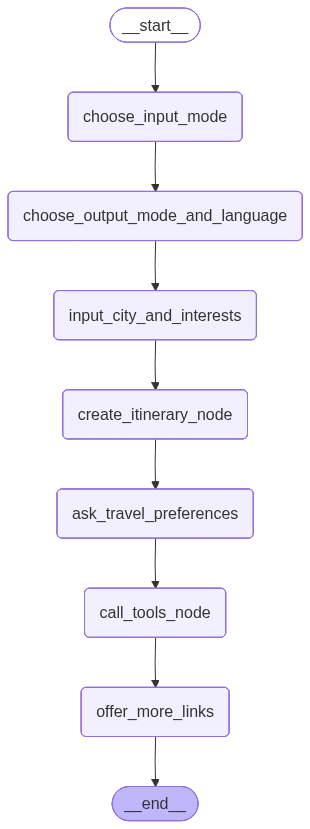

In [68]:
try:
    display(Image(app.get_graph().draw_mermaid_png(draw_method=MermaidDrawMethod.API)))
except Exception:
    pass

**Define the function that runs the graph**

In [69]:
# ---------- Interactive Runner ----------
def run_travel_planner_interactive(initial_user_request: str = ""):
    print(f"Initial Request: {initial_user_request}\n")

    # Initialize full state
    state: PlannerState = {
        "messages": [HumanMessage(content=initial_user_request)],
        "city": "",
        "interests": [],
        "itinerary": "",
        "input_mode": "text",
        "output_mode": "text",
        "language": "en",
        # Flights
        "departure_airport": None,
        "arrival_airport": None,
        "outbound_date": None,
        "return_date": None,
        "want_flights": False,
        # Hotels
        "want_hotels": False,
        "hotel_check_in": None,
        "hotel_check_out": None,
        # Cars
        "want_cars": False,
        "pickup_location": None,
        "dropoff_location": None,
        "pickup_date": None,
        "dropoff_date": None,
        "pickup_time": None,
        "dropoff_time": None,
        "car_class": None,
        # Restaurants / Cafes
        "want_restaurants": False,
        "restaurant_query": None,
        "restaurant_results_limit": 5
    }

    # Use try/except to safely extract updated state
    try:
        for step_output in app.stream(state):
            # If the step returns a dict, merge it into state
            if isinstance(step_output, dict):
                state.update(step_output)

            # Access messages safely
            msgs = state.get("messages", [])
            if msgs:
                last_msg = msgs[-1]
                if isinstance(last_msg, AIMessage):
                    if state.get("output_mode", "text") == "text":
                        print(f"\nAI: {last_msg.content}\n")
                    else:
                        speak_text(last_msg.content, lang=state.get("language", "en"))

    except KeyError as ke:
        print(f"KeyError caught: {ke}, current state keys: {list(state.keys())}")


**Use Case Example**

In [ ]:
user_request = "I want to plan a day trip."
run_travel_planner_interactive(user_request)

Initial Request: I want to plan a day trip.

Choose input mode: (1) text (2) audio-file
Your choice [1/2]: 1
Choose output mode: (1) text (2) audio
Your choice [1/2]: 1
Choose language code (e.g., en, hi, es). Default 'en':
Language: en
Please enter the city you want to visit for your day trip: Kashmir
Please enter your interests for the trip to Kashmir (comma-separated): nature, lakes, mountains, photography, local cuisine

Final Itinerary:
Kashmir, often called "Paradise on Earth," is a dream for nature lovers and photographers. This itinerary focuses on a full day exploring its serene lakes, majestic mountains, lush gardens, and delectable local cuisine, all centered around Srinagar to maximize experiences without excessive travel.

---

**Kashmir Nature & Photography Day Trip: Srinagar's Lakeside & Mountain Panoramas**

**Theme:** Lakes, Gardens, Panoramic Mountain Views, Photography, Local Cuisine
**Base:** Srinagar
**Best Time to Visit:** Spring (April-May for blossoms) or Autumn

In [61]:
user_request = "I want to plan a trip."
run_travel_planner_interactive(user_request)

Initial Request: I want to plan a trip.

Choose input mode: (1) text (2) audio-file
Your choice [1/2]: 1
Choose output mode: (1) text (2) audio
Your choice [1/2]: 2
Choose language code (e.g., en, hi, es). Default 'en':
Language: en
Please enter the city you want to visit for your day trip: Paris
Please enter your interests for the trip to Paris (comma-separated): art, history, landmarks, cafes, photography

Final Itinerary:
Bonjour and welcome to a whirlwind day of Parisian enchantment! This itinerary is designed to immerse you in the city's unparalleled blend of art, history, iconic landmarks, charming cafes, and endless photographic opportunities. Get ready for an unforgettable journey through the City of Lights!

---

## A Parisian Masterpiece: Art, History & Charm in a Day

**Theme:** Immerse yourself in Parisian culture, from ancient art to modern history, iconic views, and the quintessential cafe experience.

---

### ☀️ Morning (7:30 AM - 12:00 PM): Art & Imperial Grandeur

*  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Do you want hotel options? (y/n): y
Do you want car rental options? (y/n): n
Do you want restaurant/coffee shop options? (y/n): y
Do you want flight options? (y/n):
y
Do you want hotel options? (y/n):
y
Departure airport code (IATA), e.g., LAX: DEL
Arrival airport code (IATA), e.g., NYC: SXR
Outbound date (YYYY-MM-DD): 2026-06-01
Return date (YYYY-MM-DD) or leave blank for one-way: 2026-06-01
Hotel check-in date (YYYY-MM-DD): 2026-05-01
Hotel check-out date (YYYY-MM-DD): 2026-06-01
If you'd like more resources:
YouTube: https://www.youtube.com/results?search_query=Paris+travel+art%2Chistory%2Clandmarks%2Ccafes%2Cphotography
Google: https://www.google.com/search?q=Paris+travel+guide+art%2Chistory%2Clandmarks%2Ccafes%2Cphotography
[Audio saved at: /tmp/tts_out.mp3]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [71]:
user_request = "I want to plan a trip."
run_travel_planner_interactive(user_request)

Initial Request: I want to plan a trip.

Choose input mode: (1) text (2) audio-file
Your choice [1/2]: 1
Choose output mode: (1) text (2) audio
Your choice [1/2]: 1
Choose language code (e.g., en, hi, es). Default 'en':
Language: hi
Please enter the city you want to visit for your day trip: Australia 
Please enter your interests for the trip to Australia (comma-separated): wildlife, stunning natural landscapes like the Great Barrier Reef and the Outback, and iconic landmarks 

Final Itinerary:
**ऑस्ट्रेलिया का एक दिवसीय काल्पनिक यात्रा कार्यक्रम: वन्यजीव, प्राकृतिक सौंदर्य और प्रतिष्ठित स्थल**

**परिचय:**
ऑस्ट्रेलिया एक विशाल और विविध देश है, जहाँ एक ही दिन में ग्रेट बैरियर रीफ़, आउटबैक और सिडनी जैसे प्रतिष्ठित स्थलों का अनुभव करना व्यावहारिक रूप से असंभव है। हालाँकि, यह यात्रा कार्यक्रम एक "आदर्श" या "काल्पनिक" दिन प्रस्तुत करता है, जहाँ आप ऑस्ट्रेलिया के कुछ सबसे अविश्वसनीय अनुभवों को एक साथ जोड़ सकते हैं, जैसे कि आप समय और दूरी की बाधाओं को पार कर सकते हों। यह आपको ऑस्ट्रेलिया के वि